In [1]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.animation import FuncAnimation, FFMpegWriter
from IPython.display import HTML, display

N = 20

# Erdos-Renyi edge probability
p_edge = 0.3

# Simulation parameters
dt = 0.05
formation_tolerance = 0.05
max_steps = 500

# Formation weights
a = 1.0

# Strength of centering/reference tracking
b = 0.5

np.random.seed(42)

Number of nodes: 20
Number of edges: 52
Connected: True


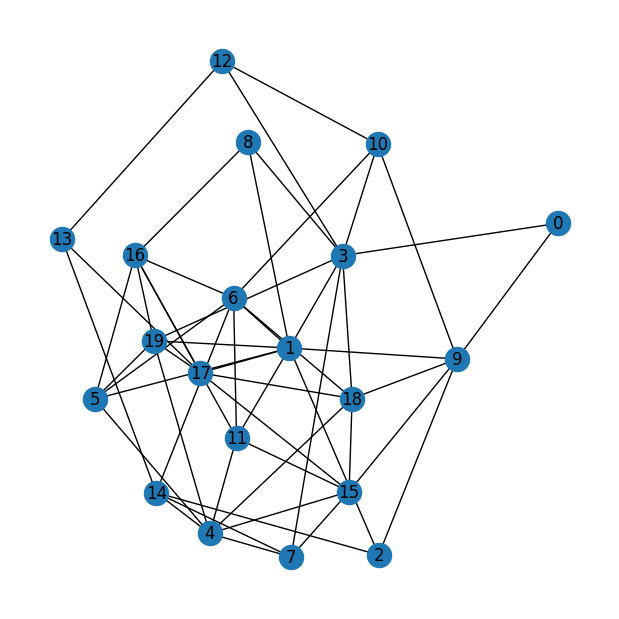

In [2]:
def generate_connected_graph(N, p_edge):
    G = nx.erdos_renyi_graph(N, p_edge)
    while not nx.is_connected(G):
        G = nx.erdos_renyi_graph(N, p_edge)
    return G

G = generate_connected_graph(N, p_edge)
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())
print("Connected:", nx.is_connected(G))

plt.figure(figsize=(6, 6))
nx.draw(G, with_labels=True)
plt.show()

In [3]:
neighbors = {
    i: list(G.neighbors(i)) for i in range(N)
}

def random_initial_positions():
  return np.random.uniform(
      low=-8,
      high=8,
      size=(N, 2)
  )

positions = random_initial_positions()

In [4]:
LETTER_TARGETS = {
    "P": np.array([
        # vertical
        [-1.0, -2.0],
        [-1.0, -1.555556],
        [-1.0, -1.111111],
        [-1.0, -0.666667],
        [-1.0, -0.222222],
        [-1.0,  0.222222],
        [-1.0,  0.666667],
        [-1.0,  1.111111],
        [-1.0,  1.555556],
        [-1.0,  2.0],

        # bowl
        [-0.381966,  1.951057],
        [ 0.175571,  1.809017],
        [ 0.618034,  1.587785],
        [ 0.902113,  1.309017],
        [ 1.0,       1.0],
        [ 0.902113,  0.690983],
        [ 0.618034,  0.412215],
        [ 0.175571,  0.190983],
        [-0.381966,  0.048943],
        [-1.0,       0.0],
    ]),

    "A": np.array([
        # left diagonal
        [-1.0, -2.0],
        [-0.857143, -1.428571],
        [-0.714286, -0.857143],
        [-0.571429, -0.285714],
        [-0.428571,  0.285714],
        [-0.285714,  0.857143],
        [-0.142857,  1.428571],
        [ 0.0,       2.0],

        # right diagonal
        [ 0.142857,  1.428571],
        [ 0.285714,  0.857143],
        [ 0.428571,  0.285714],
        [ 0.571429, -0.285714],
        [ 0.714286, -0.857143],
        [ 0.857143, -1.428571],
        [ 1.0,      -2.0],

        # crossbar
        [-0.625, -0.5],
        [-0.3125, -0.5],
        [ 0.0,   -0.5],
        [ 0.3125, -0.5],
        [ 0.625, -0.5],
    ]),

    "T": np.array([
        # top bar
        [-1.0,  2.0],
        [-0.666667, 2.0],
        [-0.333333, 2.0],
        [ 0.0,  2.0],
        [ 0.333333, 2.0],
        [ 0.666667, 2.0],
        [ 1.0,  2.0],

        # vertical
        [ 0.0,  1.5],
        [ 0.0,  1.208333],
        [ 0.0,  0.916667],
        [ 0.0,  0.625],
        [ 0.0,  0.333333],
        [ 0.0,  0.041667],
        [ 0.0, -0.25],
        [ 0.0, -0.541667],
        [ 0.0, -0.833333],
        [ 0.0, -1.125],
        [ 0.0, -1.416667],
        [ 0.0, -1.708333],
        [ 0.0, -2.0],
    ]),

    "E": np.array([
        # vertical
        [-1.0,  2.0],
        [-1.0,  1.5],
        [-1.0,  1.0],
        [-1.0,  0.5],
        [-1.0,  0.0],
        [-1.0, -0.5],
        [-1.0, -1.0],
        [-1.0, -1.5],
        [-1.0, -2.0],

        # top bar
        [-0.5,  2.0],
        [ 0.0,  2.0],
        [ 0.5,  2.0],
        [ 1.0,  2.0],

        # middle bar
        [-0.5,  0.0],
        [ 0.0,  0.0],
        [ 0.5,  0.0],
        [ 1.0,  0.0],

        # bottom bar
        [-0.333333, -2.0],
        [ 0.333333, -2.0],
        [ 1.0,      -2.0],
    ]),

    "L": np.array([
        # vertical
        [-1.0,  2.0],
        [-1.0,  1.636364],
        [-1.0,  1.272727],
        [-1.0,  0.909091],
        [-1.0,  0.545455],
        [-1.0,  0.181818],
        [-1.0, -0.181818],
        [-1.0, -0.545455],
        [-1.0, -0.909091],
        [-1.0, -1.272727],
        [-1.0, -1.636364],
        [-1.0, -2.0],

        # bottom bar
        [-1.0, -2.0],
        [-0.714286, -2.0],
        [-0.428571, -2.0],
        [-0.142857, -2.0],
        [ 0.142857, -2.0],
        [ 0.428571, -2.0],
        [ 0.714286, -2.0],
        [ 1.0, -2.0],
    ]),
}

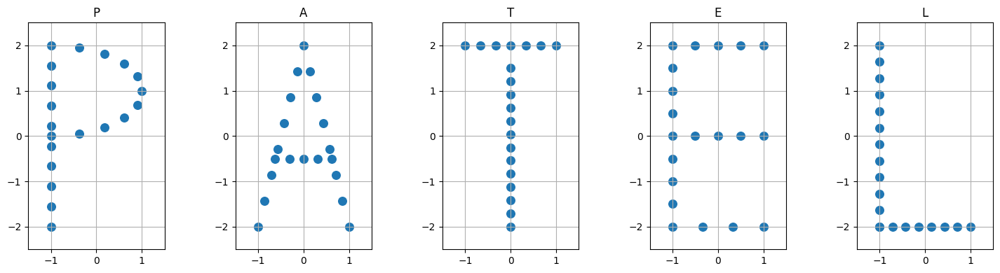

In [5]:
fig, axes = plt.subplots(1, 5, figsize=(15, 4))

for ax, letter in zip(axes, "PATEL"):

    points = LETTER_TARGETS[letter]

    ax.scatter(
        points[:, 0],
        points[:, 1],
        s=70
    )

    ax.set_title(letter)
    ax.set_xlim(-1.5, 1.5)
    ax.set_ylim(-2.5, 2.5)
    ax.set_aspect("equal")
    ax.grid()

plt.tight_layout()
plt.show()

In [6]:
def formation_control(positions, targets):
    u = np.zeros_like(positions)

    for i in range(N):

        # Formation control term
        for j in neighbors[i]:

            relative_error = (
                (positions[j] - positions[i])
                - (targets[j] - targets[i])
            )

            u[i] += a * relative_error

        # Reference / centering term
        tracking_error = targets[i] - positions[i]

        u[i] += b * tracking_error

    return u

def update_positions(positions, targets):
    u = formation_control(
        positions,
        targets
    )

    positions = positions + dt * u

    return positions

def formation_error(positions, targets):
    errors = np.linalg.norm(
        positions - targets,
        axis=1
    )

    return np.max(errors)

def simulate_letter(positions, letter):

    targets = LETTER_TARGETS[letter]

    trajectory = [positions.copy()]

    for step in range(max_steps):

        positions = update_positions(
            positions,
            targets
        )

        trajectory.append(
            positions.copy()
        )

        error = formation_error(
            positions,
            targets
        )

        if error < formation_tolerance:
            break

    return positions, trajectory

In [7]:
def simulate_name(name):

    positions = random_initial_positions()

    all_trajectories = []
    all_letters = []

    for letter in name:

        positions, trajectory = simulate_letter(
            positions,
            letter
        )

        all_trajectories.extend(trajectory)
        all_letters.extend(
            [letter] * len(trajectory)
        )

    return all_trajectories, all_letters

trajectories, letters = simulate_name("PATEL")

In [8]:
fig, ax = plt.subplots(figsize=(7, 7))

ax.set_xlim(-2, 2)
ax.set_ylim(-3, 3)
ax.set_aspect("equal")
ax.grid()

agents = ax.scatter([], [], s=80)

title = ax.set_title("")


def init():
    agents.set_offsets(np.empty((0, 2)))
    title.set_text("")
    return agents, title


def animate(frame):
    positions = trajectories[frame]
    letter = letters[frame]

    agents.set_offsets(positions)
    title.set_text(f"Formation: {letter}")

    return agents, title


animation = FuncAnimation(
    fig,
    animate,
    frames=len(trajectories),
    init_func=init,
    interval=20,
    blit=True
)

plt.close(fig)

display(HTML(animation.to_jshtml()))

In [9]:
writer = FFMpegWriter(
    fps=20,
    metadata={
        "title": "PATEL - Multi-Agent Formation Control"
    },
    bitrate=3000
)

animation.save(
    "PATEL_formation.mp4",
    writer=writer
)